In [2]:
import os, random
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm import tqdm


os.makedirs('./processed_images', exist_ok=True)

all_images = os.listdir('./coco/images')

# === 3. Define transformations ===
resize_normalize = transforms.Compose([
    transforms.Resize((450, 450)),
    transforms.ToTensor(),  # normalize [0,1]
])

augment = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.3),
])

# === 4. Process all images ===
gap = 30
for i, img_name in enumerate(tqdm(all_images, desc="Processing images")):
    try:
        img_path = f'./coco/images/{img_name}'
        img = Image.open(img_path).convert('RGB')

        # --- Resize & normalize ---
        img_tensor = resize_normalize(img)
        img_norm = (img_tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
        img_norm_pil = Image.fromarray(img_norm)

        # --- Augment ---
        img_aug = augment(img_norm_pil).resize((450, 450))

        combined_width = 450 * 2 + gap
        combined = Image.new('RGB', (combined_width, 450), color=(255, 255, 255))

        # Paste original and processed
        combined.paste(img.resize((450, 450)), (0, 0))
        combined.paste(img_aug, (450 + gap, 0))

        # Add labels
        draw = ImageDraw.Draw(combined)
        draw.text((150, 10), "Original", fill=(0, 0, 0))
        draw.text((450 + gap + 150, 10), "Processed", fill=(0, 0, 0))

        # Save final image
        combined.save(f'./processed_images/processed_{i+1}.jpg')

    except Exception as e:
        print(f"Error processing {img_name}: {e}")
        continue

print("✅ Done! All processed images are saved in './processed_images' with spacing.")


Processing images: 100%|██████████| 1669/1669 [01:05<00:00, 25.62it/s]

✅ Done! All processed images are saved in './processed_images' with spacing.


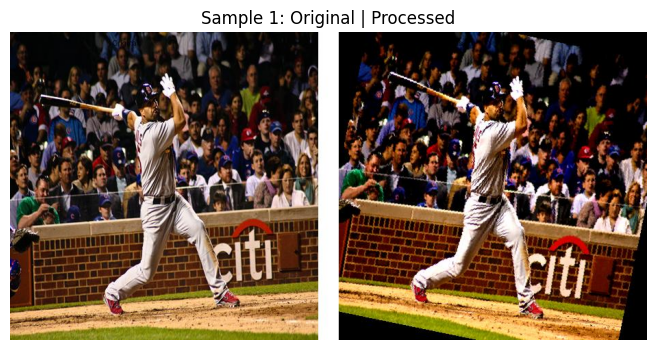

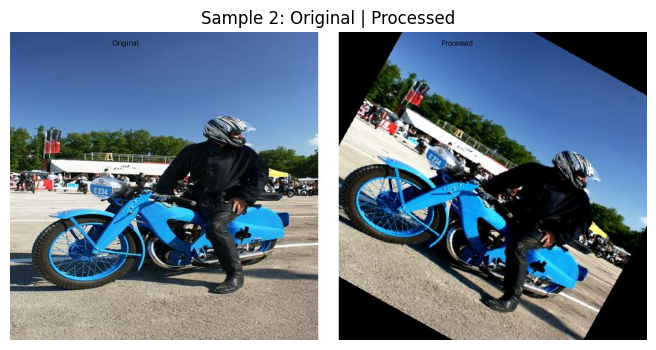

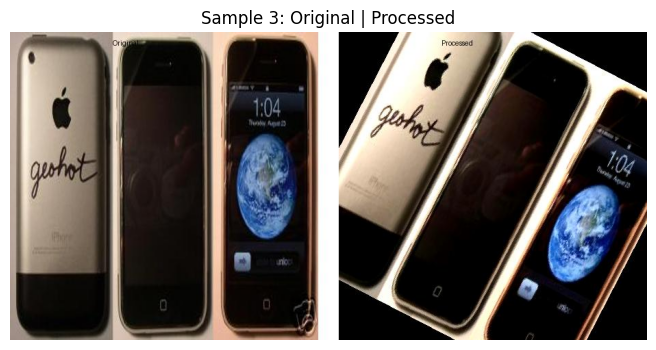

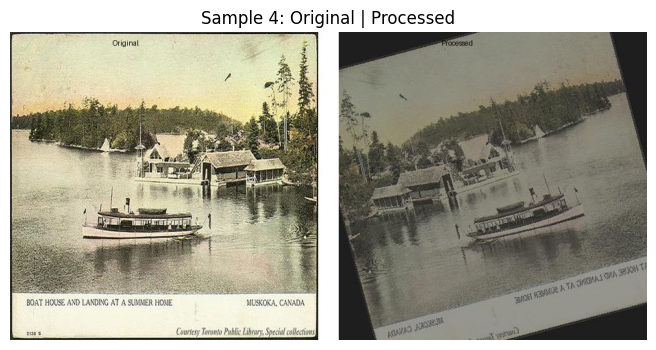

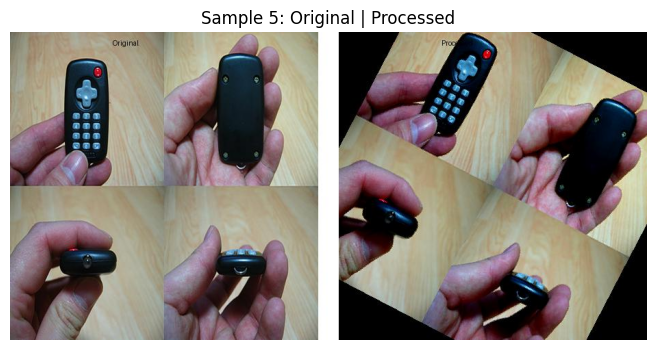

...

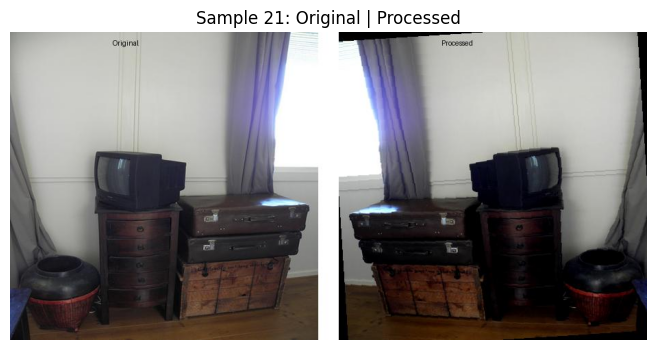

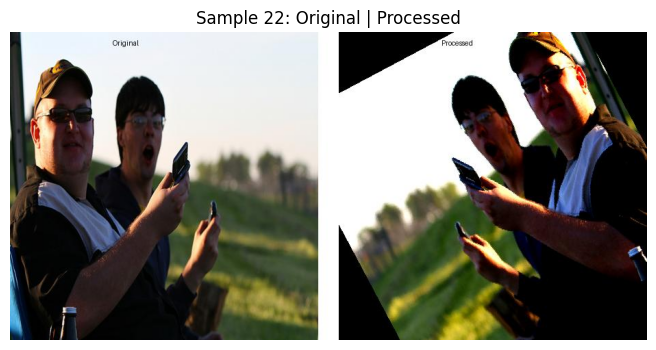

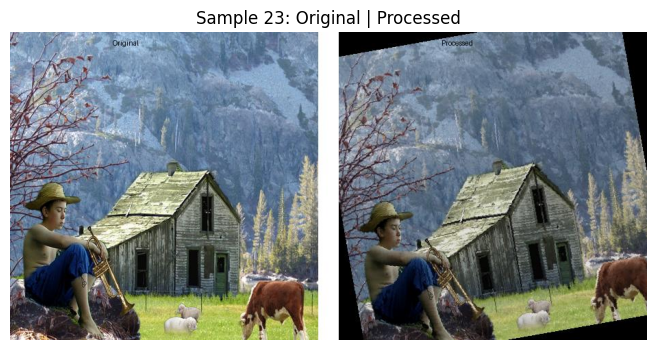

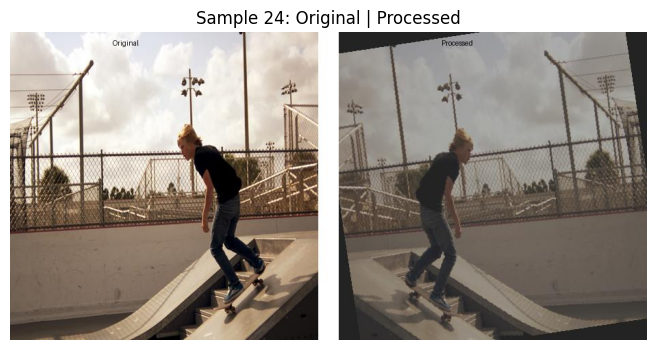

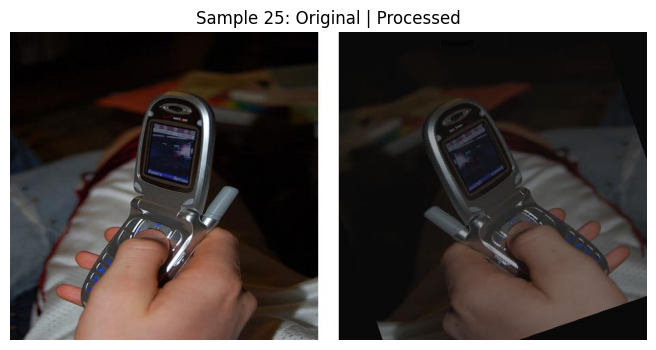

In [3]:
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

samples = random.sample(os.listdir('./processed_images'), 25)

for i, file in enumerate(samples):
    img = Image.open(f'./processed_images/{file}')
    plt.figure(figsize=(9, 4))
    plt.imshow(img)
    plt.title(f"Sample {i+1}: Original | Processed")
    plt.axis('off')
    plt.show()
